In [1]:
from fastai.vision import *

In [2]:
! {sys.executable} -m pip install kaggle --upgrade

    100% |████████████████████████████████| 61kB 8.3MB/s eta 0:00:01
    100% |████████████████████████████████| 81kB 10.3MB/s ta 0:00:01
  Running setup.py bdist_wheel for kaggle ... done
  Stored in directory: /root/.cache/pip/wheels/57/4e/e8/bb28d035162fb8f17f8ca5d42c3230e284c6aa565b42b72674
  Running setup.py bdist_wheel for python-slugify ... done
  Stored in directory: /root/.cache/pip/wheels/11/94/81/312969455540cb0e6a773e5d68a73c14128bfdfd4a7969bb4f
Successfully built kaggle python-slugify


In [3]:
! mkdir -p ~/.kaggle/
! mv kaggle.json ~/.kaggle/

In [4]:
Config.data_path()

PosixPath('/storage')

In [2]:
path = Config.data_path()/'asl'
path.mkdir(parents=True, exist_ok=True)
path

PosixPath('/storage/asl')

In [6]:
! kaggle datasets download -d grassknoted/asl-alphabet -p {path}

100%|██████████████████████████████████████| 1.03G/1.03G [00:18<00:00, 69.2MB/s]



In [7]:
! unzip -q -n {path}/asl-alphabet.zip -d {path}

In [2]:
path = Config.data_path()/'asl'
path

PosixPath('/storage/asl')

In [5]:
path.ls()

[PosixPath('/storage/asl/.ipynb_checkpoints'),
 PosixPath('/storage/asl/asl_alphabet_train'),
 PosixPath('/storage/asl/asl_alphabet_test')]

In [8]:
(path/'asl_alphabet_train'/'asl_alphabet_train').ls()

[PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/M'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/K'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/H'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/L'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/nothing'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/V'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/U'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/B'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/J'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/W'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/P'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/N'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/T'),
 PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train/del'),
 PosixPath('/storage/asl/asl_alphabet_tr

In [3]:
path = path/'asl_alphabet_train'/'asl_alphabet_train'

In [4]:
path

PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train')

In [11]:
ImageDataBunch.from_folder??

In [12]:
np.random.seed(42)
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

In [13]:
data.classes

['A',
 'B',
 'C',
 'D',
 'E',
 'F',
 'G',
 'H',
 'I',
 'J',
 'K',
 'L',
 'M',
 'N',
 'O',
 'P',
 'Q',
 'R',
 'S',
 'T',
 'U',
 'V',
 'W',
 'X',
 'Y',
 'Z',
 'del',
 'nothing',
 'space']

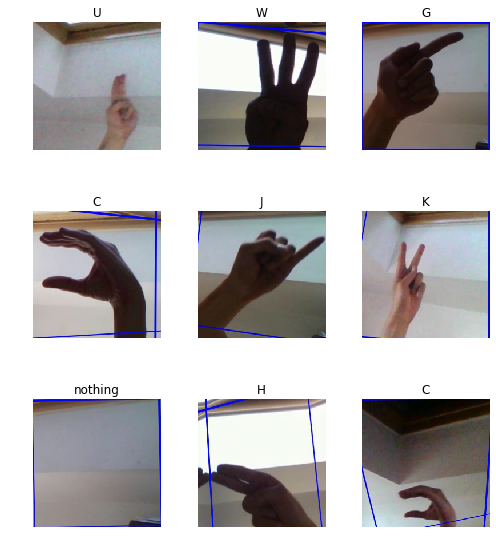

In [14]:
data.show_batch(rows=3, figsize=(7,8))

In [15]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['A',
  'B',
  'C',
  'D',
  'E',
  'F',
  'G',
  'H',
  'I',
  'J',
  'K',
  'L',
  'M',
  'N',
  'O',
  'P',
  'Q',
  'R',
  'S',
  'T',
  'U',
  'V',
  'W',
  'X',
  'Y',
  'Z',
  'del',
  'nothing',
  'space'],
 29,
 69600,
 17400)

In [16]:
learn = cnn_learner(data, models.resnet50, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


In [17]:
learn

Learner(data=ImageDataBunch;

Train: LabelList (69600 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
M,M,M,M,M
Path: /storage/asl/asl_alphabet_train/asl_alphabet_train;

Valid: LabelList (17400 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
A,W,N,space,F
Path: /storage/asl/asl_alphabet_train/asl_alphabet_train;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentu

In [18]:
learn.save('stage-1')

In [19]:
learn.lr_find()

epoch,train_loss,valid_loss,error_rate,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


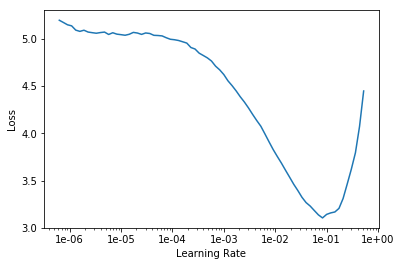

In [20]:
learn.recorder.plot()

In [21]:
learn.fit_one_cycle(8)

epoch,train_loss,valid_loss,error_rate,time
0,0.163896,0.058706,0.019540,06:59
1,0.063944,0.013756,0.004195,06:58
2,0.028099,0.004287,0.001494,06:58
3,0.020373,0.001599,0.000402,07:01
4,0.010043,0.000390,0.000115,06:58
5,0.006513,0.000190,0.000115,06:58
6,0.003966,0.000026,0.000000,06:58
7,0.003083,0.000097,0.000057,06:58


In [22]:
learn

Learner(data=ImageDataBunch;

Train: LabelList (69600 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
M,M,M,M,M
Path: /storage/asl/asl_alphabet_train/asl_alphabet_train;

Valid: LabelList (17400 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
A,W,N,space,F
Path: /storage/asl/asl_alphabet_train/asl_alphabet_train;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentu

In [23]:
learn.save('stage-2')

In [24]:
path

PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train')

In [25]:
path_test = path/'..'/'..'

In [26]:
path

PosixPath('/storage/asl/asl_alphabet_train/asl_alphabet_train')

In [4]:
path_test = Path('/storage/asl/asl_alphabet_test/asl_alphabet_test')

In [30]:
path_test.ls()

[PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/b1.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/L_test.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/I_test.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/N_test.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/D_test.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/A_test.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/C_test.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/space_test.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/G_test.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/M_test.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/b2.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/H_test.jpg'),
 PosixPath('/storage/asl/asl_alphabet_test/asl_alphabet_test/nothing_test.jpg'),
 PosixPath('/storage/as

In [32]:
im1 = open_image(path_test/'b1.jpg')

In [34]:
pred, _, _ = learn.predict(im1)

In [35]:
pred

Category M

In [36]:
pred, _, _ = learn.predict(open_image(path_test/'C_test.jpg'))

In [37]:
pred

Category C

In [42]:
pred, _, _ = learn.predict(open_image(path_test/'b4.jpg'))
pred

Category B

In [43]:
learn.export()

In [6]:
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=get_transforms(do_flip=False), size=200, num_workers=4).normalize(imagenet_stats)

In [7]:
data.batch_size

64

In [8]:
data

ImageDataBunch;

Train: LabelList (69600 items)
x: ImageList
Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200)
y: CategoryList
M,M,M,M,M
Path: /storage/asl/asl_alphabet_train/asl_alphabet_train;

Valid: LabelList (17400 items)
x: ImageList
Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200)
y: CategoryList
L,N,G,E,G
Path: /storage/asl/asl_alphabet_train/asl_alphabet_train;

Test: None

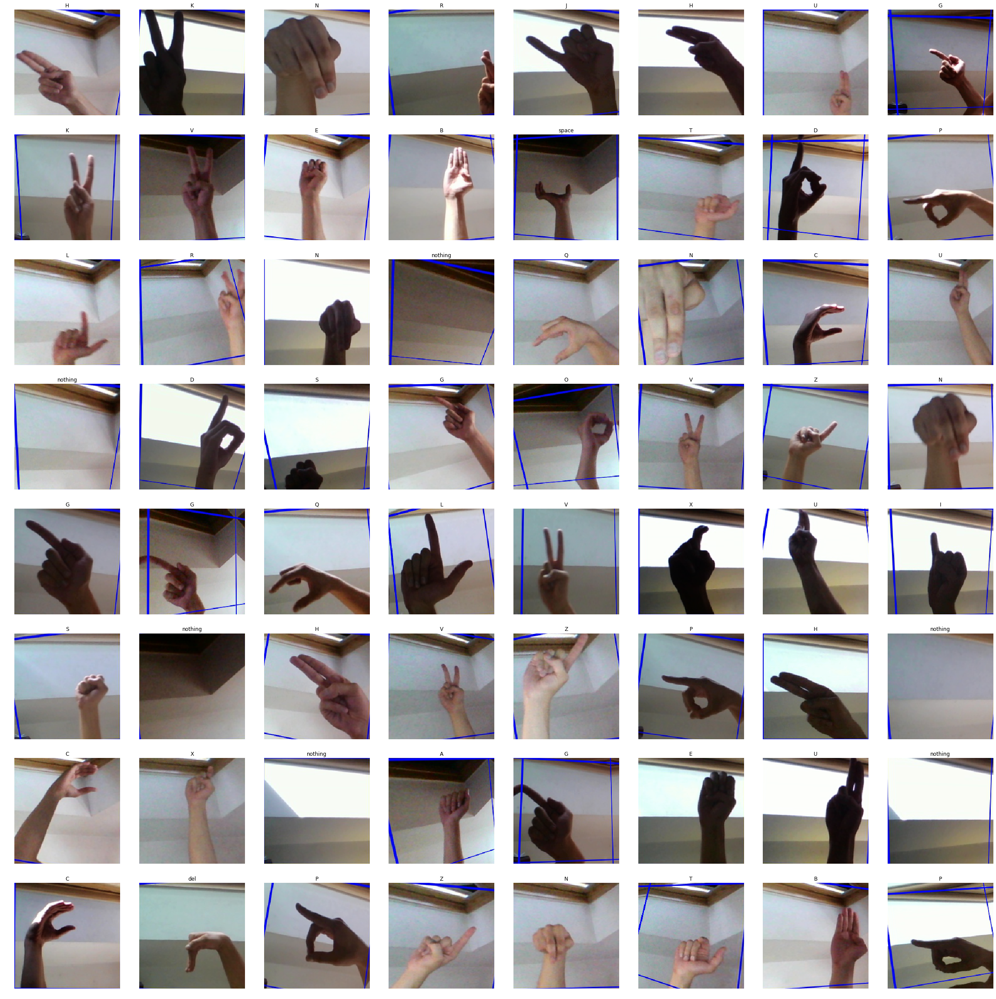

In [9]:
data.show_batch(rows=10)

In [5]:
tfms = ([*rand_pad(padding=3, size=28, mode='zeros')], [])

In [8]:
data = (ImageList.from_folder(path)
        .split_by_rand_pct()
        .label_from_folder()
        .databunch()
        .normalize() )

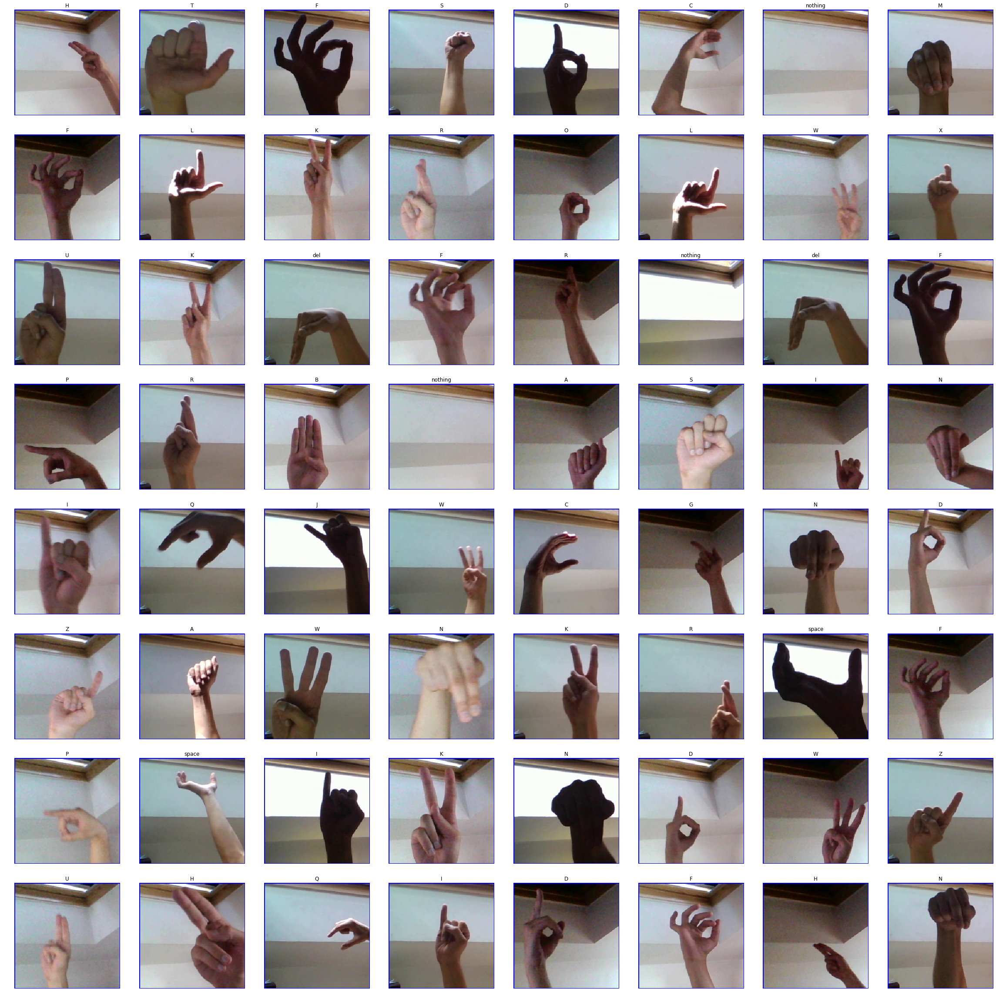

In [9]:
data.show_batch(rows=10)

In [10]:
learn = cnn_learner(data, models.resnet34, metrics=error_rate)

In [11]:
learn.lr_find()

epoch,train_loss,valid_loss,error_rate,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


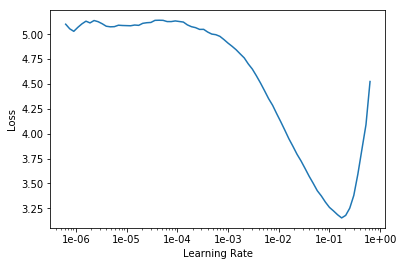

In [12]:
learn.recorder.plot()

In [13]:
learn.fit_one_cycle(3, slice(1e-2))

epoch,train_loss,valid_loss,error_rate,time
0,0.122384,0.023760,0.006437,03:15
1,0.019390,0.007611,0.002011,03:18
2,0.001376,0.000015,0.000000,03:18


In [17]:
pred, pred_idx, output = learn.predict(open_image(path_test/'C_test.jpg'))
pred, pred_idx, output

(Category C,
 tensor(2),
 tensor([9.0863e-20, 6.7758e-23, 1.0000e+00, 4.6751e-21, 2.4493e-23, 5.6865e-18,
         7.6093e-22, 1.2268e-20, 1.1118e-30, 5.2579e-28, 6.5039e-22, 5.3572e-20,
         7.7120e-26, 1.6601e-25, 3.6371e-19, 9.3653e-23, 2.0427e-19, 1.5301e-24,
         6.2115e-26, 5.2398e-17, 2.3739e-24, 4.1236e-28, 3.5460e-30, 1.1622e-24,
         8.5632e-30, 3.0313e-24, 6.2367e-22, 5.9393e-24, 1.5506e-21]))

In [18]:
learn.save('v2')

In [19]:
learn.export()

*Version 3*

In [19]:
from fastai.vision import *

In [6]:
path = Config.data_path()/'asl'/'asl_alphabet_train'/'asl_alphabet_train'
path_test = Path('/storage/asl/asl_alphabet_test/asl_alphabet_test')

In [7]:
tfms = get_transforms(do_flip=False, flip_vert=False, max_rotate=None, max_warp=None)

In [8]:
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=tfms, size=200, num_workers=4).normalize(imagenet_stats)

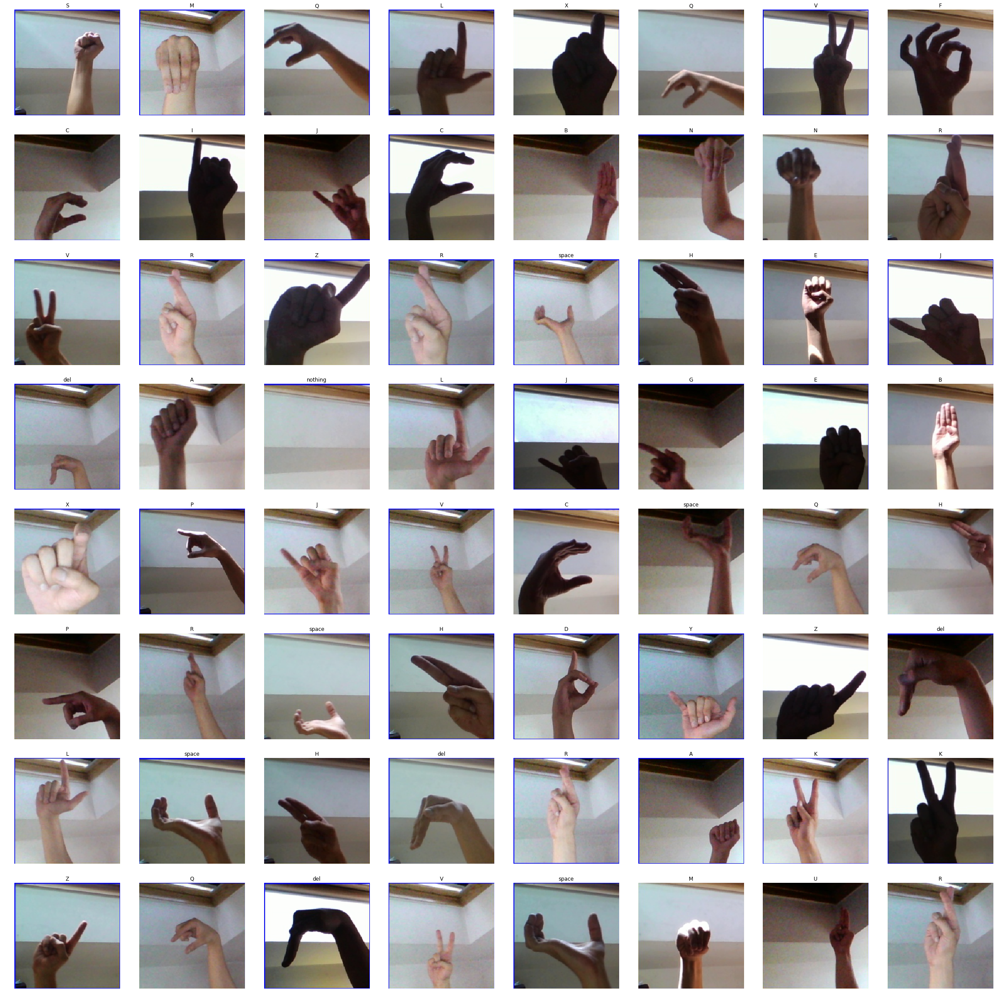

In [23]:
data.show_batch(rows=10)

In [24]:
learn = cnn_learner(data, models.resnet50, metrics=accuracy, wd=1e-1)

In [25]:
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


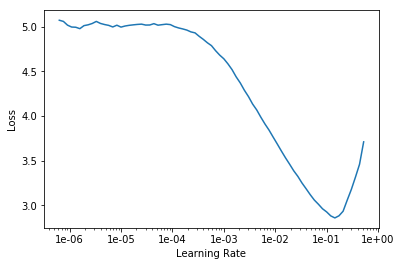

In [26]:
learn.recorder.plot()

In [27]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,accuracy,time
0,0.078308,0.034187,0.988736,06:29
1,0.012093,0.002840,0.999253,06:30
2,0.002566,0.000422,1.000000,06:30
3,0.001001,0.000096,1.000000,06:31


In [33]:
learn.predict(open_image(path_test/'C_test.jpg'))

(Category C,
 tensor(2),
 tensor([9.0551e-10, 4.0963e-08, 1.0000e+00, 4.7341e-10, 5.2667e-10, 2.8198e-09,
         2.3157e-11, 4.9769e-09, 1.1674e-11, 4.4414e-12, 6.7319e-11, 6.1845e-10,
         5.6656e-10, 1.8320e-08, 1.0796e-07, 8.5961e-10, 1.5702e-08, 7.6406e-10,
         7.9430e-11, 1.8486e-08, 2.8700e-10, 2.9060e-11, 1.2739e-10, 7.6200e-10,
         4.3786e-11, 5.1241e-10, 7.9349e-10, 2.3323e-09, 7.6349e-10]))

In [34]:
learn.save('v3')

In [35]:
learn.export()

Version 4

In [5]:
from fastai.vision import *

In [ ]:
tfms = get_transforms(do_flip=False, flip_vert=False, max_rotate=None, max_warp=None)

In [ ]:
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=tfms, size=200, num_workers=4).normalize(imagenet_stats)

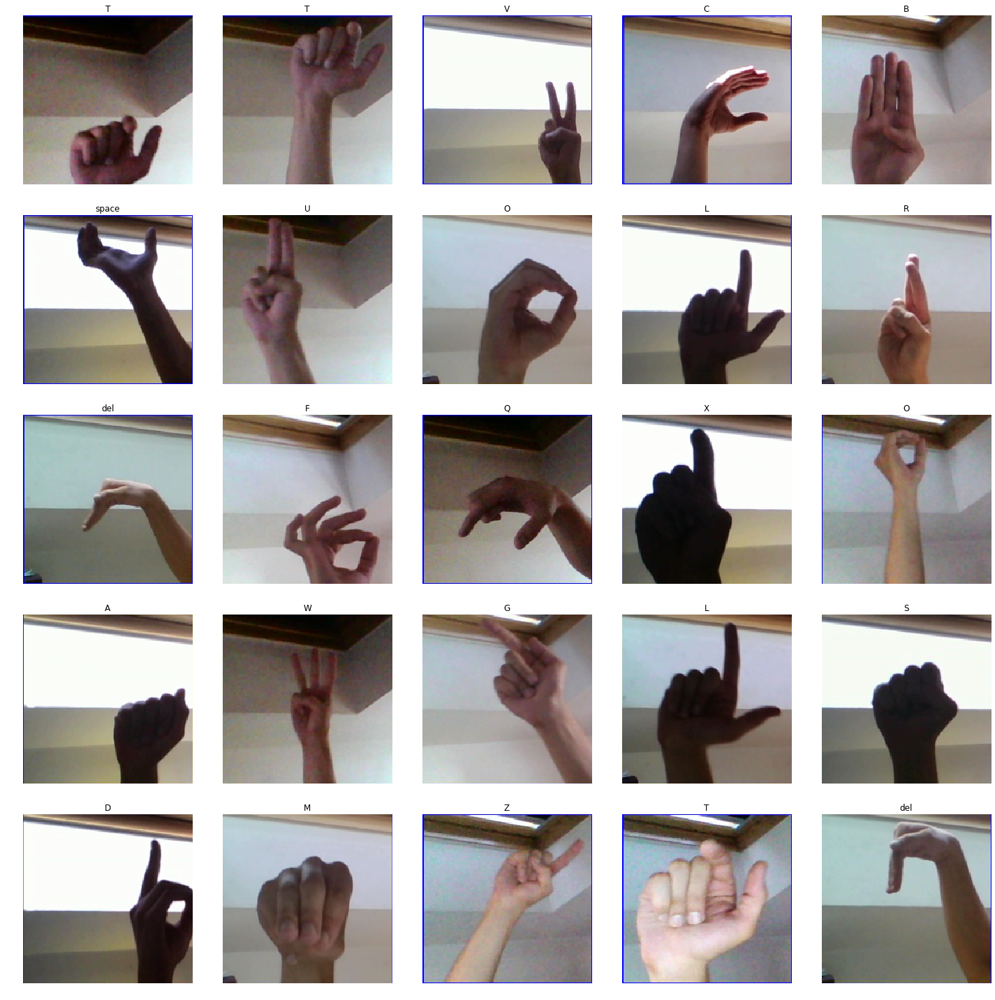

In [9]:
data.show_batch(row=5)

In [10]:
learn = cnn_learner(data, models.resnet50, metrics=accuracy, wd=1e-1)

In [11]:
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


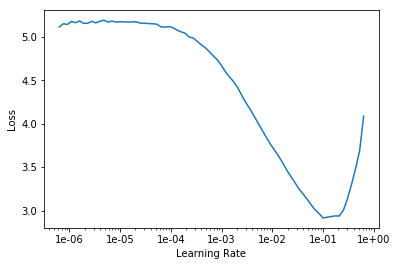

In [12]:
learn.recorder.plot()

In [13]:
learn.fit_one_cycle?

In [14]:
learn.fit_one_cycle(8, slice(3e-2))

epoch,train_loss,valid_loss,accuracy,time
0,0.054145,0.012463,0.996092,06:22
1,0.124798,0.119161,0.975517,06:21
2,0.096331,0.115458,0.984425,06:23
3,0.071556,0.019499,0.994310,06:20
4,0.036928,0.035321,0.994195,06:20
5,0.011497,0.002711,0.999080,06:20
6,0.000862,0.000500,0.999828,06:20
7,0.000069,0.000403,0.999828,06:20


In [15]:
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


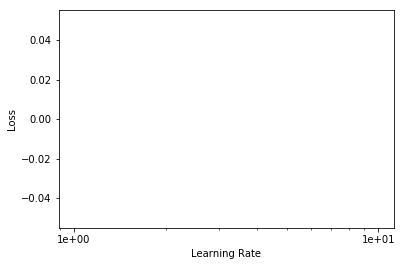

In [16]:
learn.recorder.plot()

In [17]:
learn.save('v4')

In [23]:
learn.predict(open_image(path_test/'U_test.jpg'))

(Category U,
 tensor(20),
 tensor([2.5633e-09, 1.3455e-07, 1.3655e-08, 4.2795e-08, 1.9805e-10, 7.9074e-11,
         1.1420e-09, 1.0850e-08, 8.9314e-09, 4.9321e-09, 5.1537e-09, 1.8633e-07,
         8.6147e-07, 2.3704e-10, 2.5626e-09, 3.1177e-07, 2.1357e-09, 1.1395e-07,
         4.3193e-08, 3.6909e-10, 1.0000e+00, 5.0588e-10, 1.4461e-08, 2.0551e-09,
         6.8258e-08, 2.3867e-06, 3.7463e-08, 2.1885e-08, 5.9942e-09]))

In [24]:
learn.export()

Convert fastai model to ONNX

In [1]:
from fastai.vision import *
from fastai.callbacks import *
from fastai.metrics import *

In [2]:
from fastai.vision.learner import cnn_config

In [3]:
path = Config.data_path()/'asl'/'asl_alphabet_train'/'asl_alphabet_train'
path_test = Path('/storage/asl/asl_alphabet_test/asl_alphabet_test')

In [4]:
def create_head(nf:int, nc:int, lin_ftrs:Optional[Collection[int]]=None, ps:Floats=0.5,
                concat_pool:bool=True, bn_final:bool=False):
    "Model head that takes `nf` features, runs through `lin_ftrs`, and about `nc` classes."
    lin_ftrs = [nf, 512, nc] if lin_ftrs is None else [nf] + lin_ftrs + [nc]
    ps = listify(ps)
    if len(ps) == 1: ps = [ps[0]/2] * (len(lin_ftrs)-2) + ps
    actns = [nn.ReLU(inplace=True)] * (len(lin_ftrs)-2) + [None]
    pool = AdaptiveConcatPool2d() if concat_pool else nn.AdaptiveAvgPool2d(1)
    layers = [pool, nn.Flatten()]
    for ni,no,p,actn in zip(lin_ftrs[:-1], lin_ftrs[1:], ps, actns):
        layers += bn_drop_lin(ni, no, True, p, actn)
    if bn_final: layers.append(nn.BatchNorm1d(lin_ftrs[-1], momentum=0.01))
    return nn.Sequential(*layers)

def create_cnn_model(base_arch:Callable, nc:int, cut:Union[int,Callable]=None, pretrained:bool=True,
                     lin_ftrs:Optional[Collection[int]]=None, ps:Floats=0.5, custom_head:Optional[nn.Module]=None,
                     bn_final:bool=False, concat_pool:bool=True):
    "Create custom convnet architecture"
    body = create_body(base_arch, pretrained, cut)
    if custom_head is None:
        nf = num_features_model(nn.Sequential(*body.children())) * (2 if concat_pool else 1)
        head = create_head(nf, nc, lin_ftrs, ps=ps, concat_pool=concat_pool, bn_final=bn_final)
    else: head = custom_head
    return nn.Sequential(body, head)

def my_cnn_learner(data:DataBunch, base_arch:Callable, cut:Union[int,Callable]=None, pretrained:bool=True,
                lin_ftrs:Optional[Collection[int]]=None, ps:Floats=0.5, custom_head:Optional[nn.Module]=None,
                split_on:Optional[SplitFuncOrIdxList]=None, bn_final:bool=False, init=nn.init.kaiming_normal_,
                concat_pool:bool=True, **kwargs:Any)->Learner:
    "Build convnet style learner."
    meta = cnn_config(base_arch)
    model = create_cnn_model(base_arch, data.c, cut, pretrained, lin_ftrs, ps=ps, custom_head=custom_head,
        bn_final=bn_final, concat_pool=concat_pool)
    learn = Learner(data, model, **kwargs)
    learn.split(split_on or meta['split'])
    if pretrained: learn.freeze()
    if init: apply_init(model[1], init)
    return learn

In [5]:
tfms = get_transforms(do_flip=False, flip_vert=False, max_rotate=None, max_warp=None)

In [6]:
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=tfms, size=200, num_workers=4).normalize(imagenet_stats)

In [7]:
learn = my_cnn_learner(data, models.resnet50, metrics=accuracy, wd=1e-1)

In [9]:
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


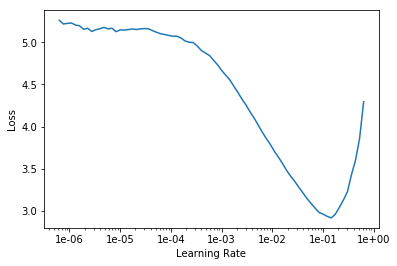

In [10]:
learn.recorder.plot()

In [11]:
learn.fit_one_cycle(8, slice(3e-2))

epoch,train_loss,valid_loss,accuracy,time
0,0.080511,0.145272,0.966609,14:44
1,0.130238,0.113298,0.970690,14:40
2,0.102997,0.026117,0.993621,14:39
3,0.043849,0.256189,0.969425,14:39
4,0.022283,0.039080,0.990287,14:39
5,0.005586,0.001437,0.999540,14:39
6,0.000673,0.000290,0.999828,14:38
7,0.001125,0.000018,1.000000,14:38


In [12]:
learn.save('v5')

In [8]:
learn.load('v5')

Learner(data=ImageDataBunch;

Train: LabelList (69600 items)
x: ImageList
Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200)
y: CategoryList
M,M,M,M,M
Path: /storage/asl/asl_alphabet_train/asl_alphabet_train;

Valid: LabelList (17400 items)
x: ImageList
Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200),Image (3, 200, 200)
y: CategoryList
B,H,N,D,S
Path: /storage/asl/asl_alphabet_train/asl_alphabet_train;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.

In [12]:
for i in path_test.ls():
    print(i, str(learn.predict(open_image(i))[0]))

/storage/asl/asl_alphabet_test/asl_alphabet_test/b1.jpg B
/storage/asl/asl_alphabet_test/asl_alphabet_test/L_test.jpg L
/storage/asl/asl_alphabet_test/asl_alphabet_test/I_test.jpg I
/storage/asl/asl_alphabet_test/asl_alphabet_test/N_test.jpg N
/storage/asl/asl_alphabet_test/asl_alphabet_test/D_test.jpg D
/storage/asl/asl_alphabet_test/asl_alphabet_test/A_test.jpg A
/storage/asl/asl_alphabet_test/asl_alphabet_test/C_test.jpg C
/storage/asl/asl_alphabet_test/asl_alphabet_test/space_test.jpg space
/storage/asl/asl_alphabet_test/asl_alphabet_test/G_test.jpg G
/storage/asl/asl_alphabet_test/asl_alphabet_test/M_test.jpg M
/storage/asl/asl_alphabet_test/asl_alphabet_test/b2.jpg C
/storage/asl/asl_alphabet_test/asl_alphabet_test/H_test.jpg H
/storage/asl/asl_alphabet_test/asl_alphabet_test/nothing_test.jpg nothing
/storage/asl/asl_alphabet_test/asl_alphabet_test/O_test.jpg O
/storage/asl/asl_alphabet_test/asl_alphabet_test/Z_test.jpg Z
/storage/asl/asl_alphabet_test/asl_alphabet_test/U_test.jp

In [13]:
learn.export()

In [14]:
learn.model.eval()

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 256

In [15]:
x = torch.randn(1, 3, 200, 200, requires_grad=False).cuda()
torch_out = torch.onnx._export(learn.model, x, '/storage/asl/asl_alphabet_train/asl_alphabet_train/models/net.onnx', export_params=True)
# str(path)